<a href="https://colab.research.google.com/github/bwdshufe/fukuilab_facial_recognition/blob/main/face200.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# ====================================================================
# 代码块 1: 环境准备、项目克隆、依赖安装和模型下载（只运行一次）
# ====================================================================

# 1. 克隆 stylegan2encoder（用于图像对齐）
!git clone https://github.com/rolux/stylegan2encoder.git
%cd stylegan2encoder

# 2. 安装对齐依赖
!pip install -q scipy dlib

# 3. 下载人脸关键点模型
!wget http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
!bzip2 -dk shape_predictor_68_face_landmarks.dat.bz2

# 4. 修复PIL兼容性问题 (针对 stylegan2encoder)
!sed -i 's/PIL.Image.ANTIALIAS/PIL.Image.LANCZOS/g' ffhq_dataset/face_alignment.py

# 5. 返回上级目录
%cd ..

# 6. 卸载冲突的datasets库
!pip uninstall -y datasets

# 7. 克隆 pSp encoder
!git clone https://github.com/eladrich/pixel2style2pixel.git

# 8. 切换到 pSp 目录安装依赖和下载模型
%cd pixel2style2pixel

# 9. 安装正确的依赖 (仅在第一次运行时需要)
!pip install -q torch==1.9.0 torchvision==0.10.0
!pip install -q lpips
!pip install -q ninja
!pip install -q gdown
!pip install -q matplotlib
!pip install -q scikit-image

# 10. 下载预训练模型 (仅在第一次运行时需要)
print("\n下载预训练的pSp模型...")
import gdown
model_url = 'https://drive.google.com/uc?id=1bMTNWkh5LArlaWSc_wa8VKyq2V42T2z0'
gdown.download(model_url, 'psp_ffhq_encode.pt', quiet=False)

# 11. 上传并替换修改后的文件
print("\n请上传你修改后的 psp.py 和 inference.py 文件:")
from google.colab import files
uploaded_mods = files.upload()

# 替换文件
for filename, content in uploaded_mods.items():
    if filename == 'psp.py':
        target_path = 'models/psp.py'
        with open(target_path, 'wb') as f:
            f.write(content)
        print(f"✅ 已用上传的 {filename} 替换 {target_path}")
    elif filename == 'inference.py':
        target_path = 'scripts/inference.py'
        with open(target_path, 'wb') as f:
            f.write(content)
        print(f"✅ 已用上传的 {filename} 替换 {target_path}")

print("\n环境准备完成。现在可以运行第二个代码块上传图片并执行投影。")

Cloning into 'stylegan2encoder'...
remote: Enumerating objects: 111, done.
remote: Total 111 (delta 0), reused 0 (delta 0), pack-reused 111 (from 1)
Receiving objects: 100% (111/111), 1.55 MiB | 14.58 MiB/s, done.
Resolving deltas: 100% (35/35), done.
/content/stylegan2encoder
--2025-10-27 10:03:27--  http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Resolving dlib.net (dlib.net)... 107.180.26.78
Connecting to dlib.net (dlib.net)|107.180.26.78|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2 [following]
--2025-10-27 10:03:28--  https://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Connecting to dlib.net (dlib.net)|107.180.26.78|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 64040097 (61M)
Saving to: ‘shape_predictor_68_face_landmarks.dat.bz2’

shape_predictor_68_ 100%[===================>]  61.07M  12.1MB/s    in 6.0s    

2025-10

Downloading...
From (original): https://drive.google.com/uc?id=1bMTNWkh5LArlaWSc_wa8VKyq2V42T2z0
From (redirected): https://drive.google.com/uc?id=1bMTNWkh5LArlaWSc_wa8VKyq2V42T2z0&confirm=t&uuid=342d0c97-5557-4d37-ac35-520f2a4d6eda
To: /content/pixel2style2pixel/psp_ffhq_encode.pt
100%|██████████| 1.20G/1.20G [00:07<00:00, 161MB/s]


请上传你修改后的 psp.py 和 inference.py 文件:


Saving inference.py to inference.py
Saving psp.py to psp.py
✅ 已用上传的 inference.py 替换 scripts/inference.py
✅ 已用上传的 psp.py 替换 models/psp.py

环境准备完成。现在可以运行第二个代码块上传图片并执行投影。



请上传你的原始人脸图像（可多张）:


Saving hirayama.JPG to hirayama.JPG
Saving satou.JPG to satou.JPG
Saving sugita.JPG to sugita.JPG
已移动: hirayama.JPG
已移动: satou.JPG
已移动: sugita.JPG
/content/stylegan2encoder

--- 正在执行图像对齐 ---
2025-10-27 10:05:36.865315: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1761559536.886238    1853 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1761559536.892840    1853 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1761559536.908793    1853 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1761559536.908823    1853 computation_placer.cc:177] comput

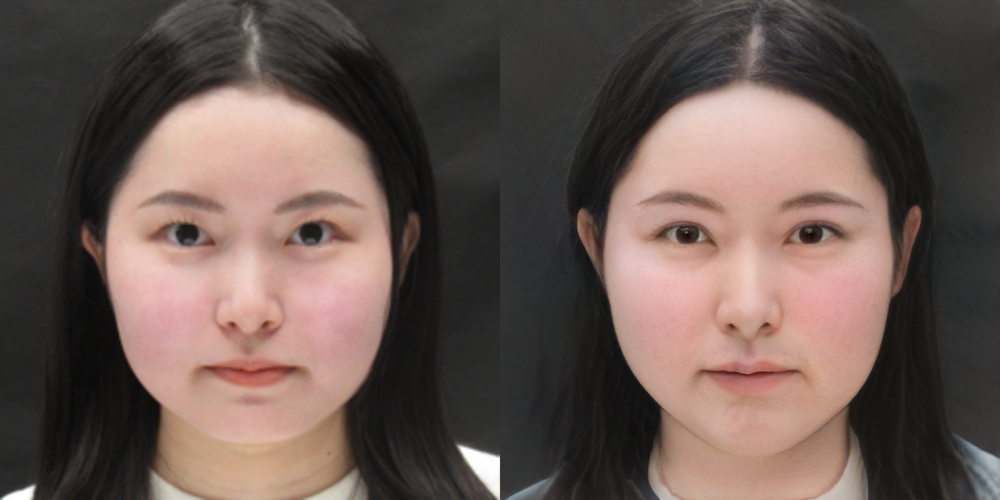


projection_output/inference_coupled/satou_01.png


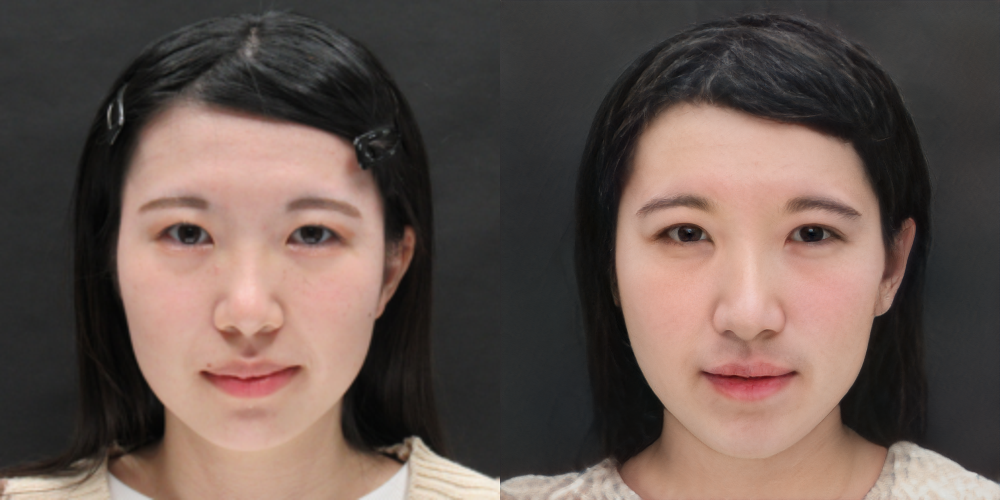


projection_output/inference_coupled/sugita_01.png


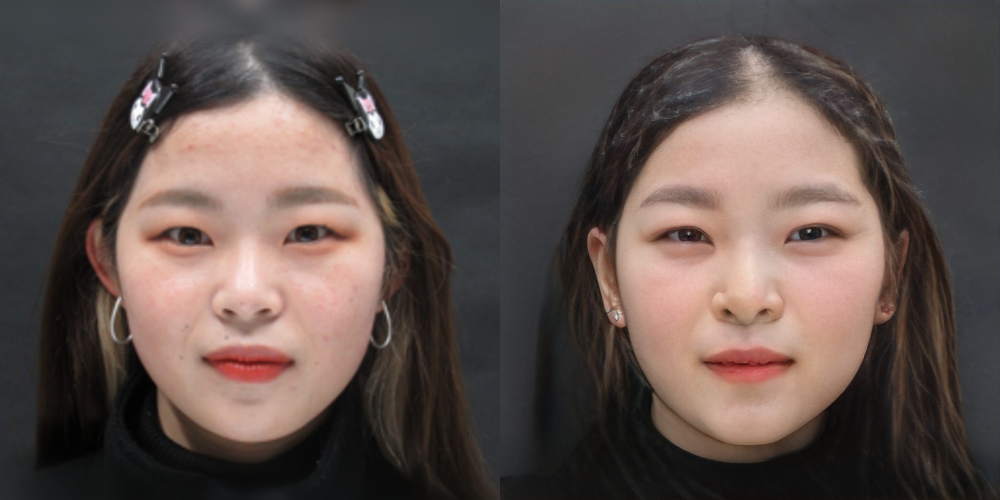


projection_output/inference_results/hirayama_01.png


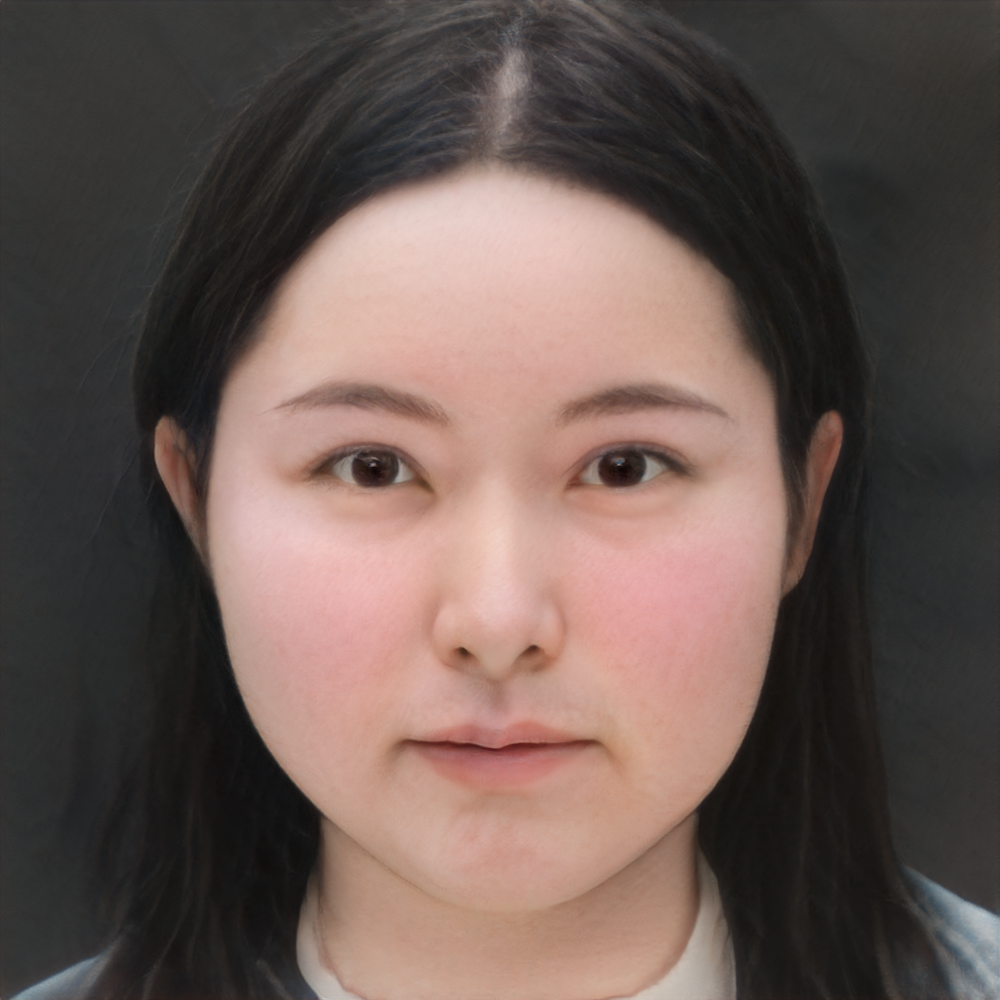


projection_output/inference_results/satou_01.png


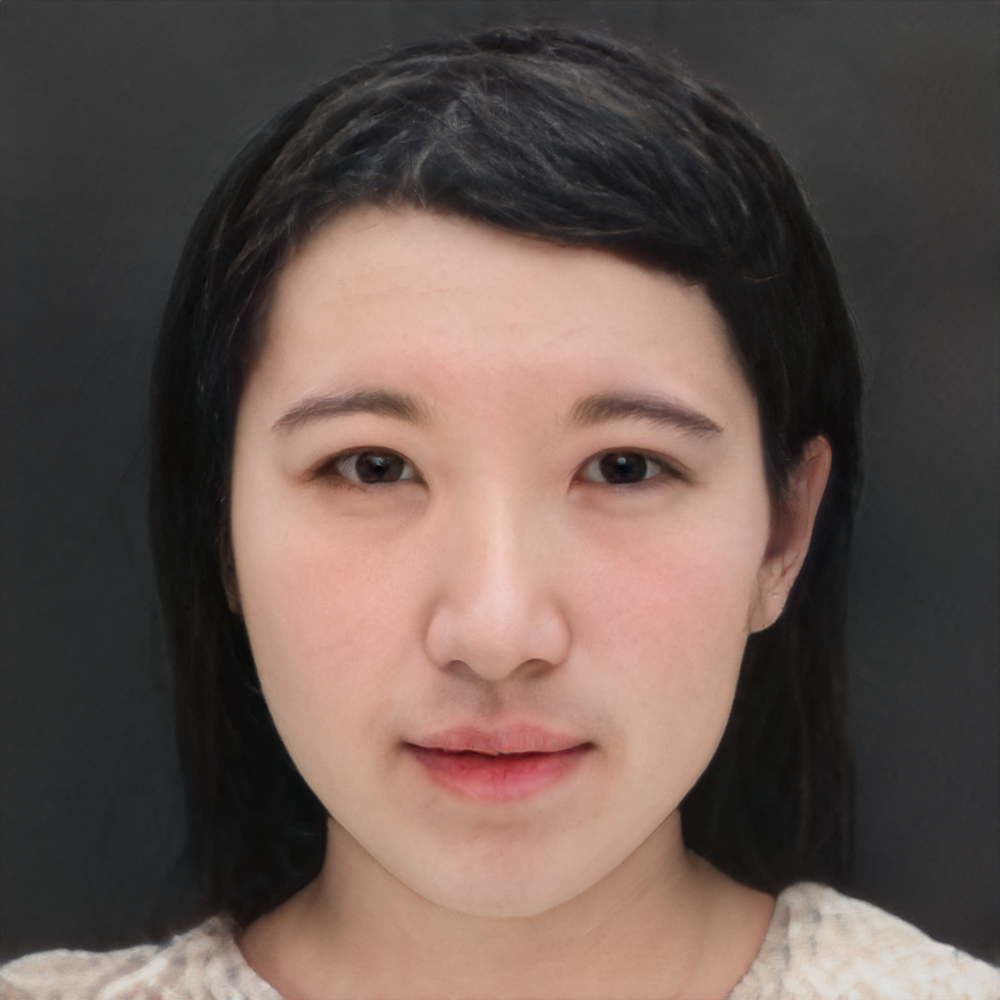


projection_output/inference_results/sugita_01.png


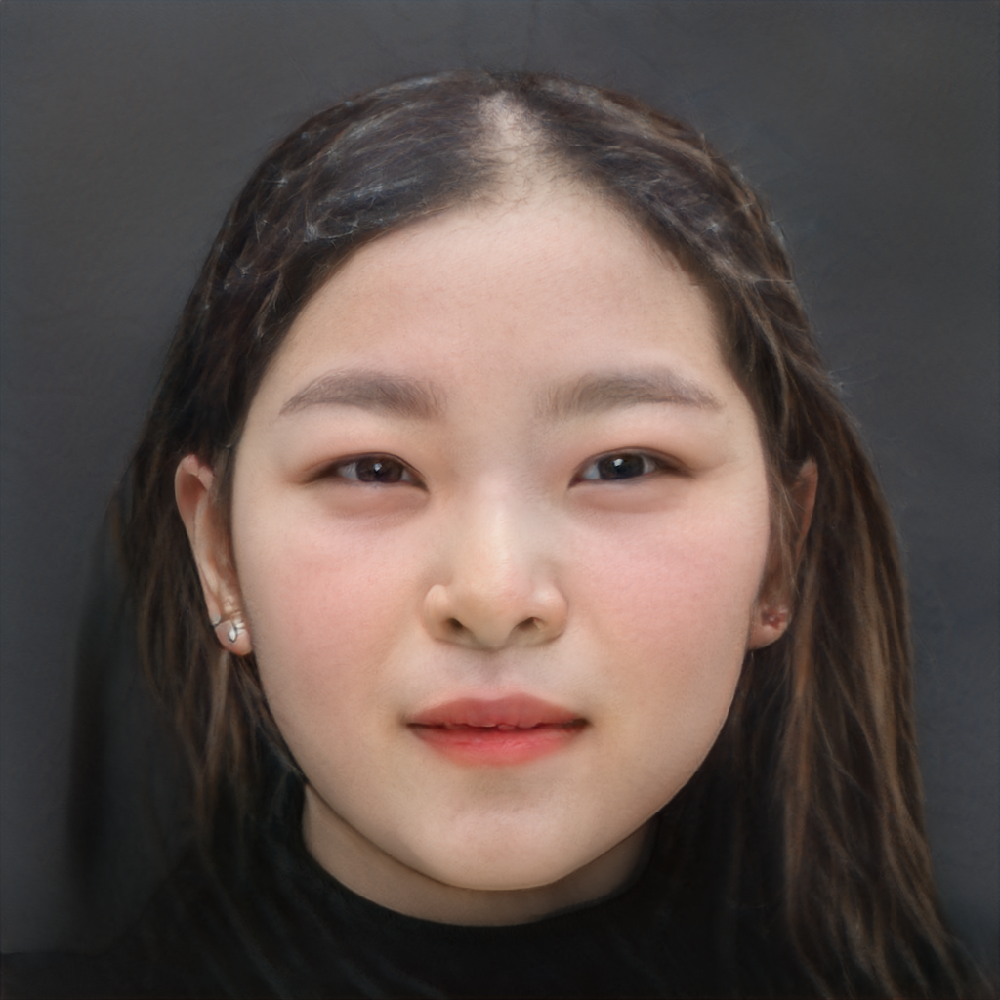


潜在代码文件 (.pt 或其他格式) 已生成，请在下载结果中查看。

开始压缩并下载结果 (包含图像和潜在代码)...
  adding: projection_output/ (stored 0%)
  adding: projection_output/inference_coupled/ (stored 0%)
  adding: projection_output/inference_coupled/satou_01.png (deflated 0%)
  adding: projection_output/inference_coupled/hirayama_01.png (deflated 0%)
  adding: projection_output/inference_coupled/sugita_01.png (deflated 0%)
  adding: projection_output/stats.txt (stored 0%)
  adding: projection_output/inference_results/ (stored 0%)
  adding: projection_output/inference_results/satou_01.png (deflated 0%)
  adding: projection_output/inference_results/hirayama_01.png (deflated 0%)
  adding: projection_output/inference_results/sugita_01.png (deflated 0%)
  adding: projection_output/inference_results/satou_01_latent.pt (deflated 9%)
  adding: projection_output/inference_results/hirayama_01_latent.pt (deflated 9%)
  adding: projection_output/inference_results/sugita_01_latent.pt (deflated 9%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

✅ 下载完成！


In [ ]:
# ====================================================================
# 代码块 2: 上传、对齐、投影、显示和下载（可重复执行）
# ====================================================================

from google.colab import files
from IPython.display import Image, display
import glob
import shutil
import os
import sys

# 确保在正确的目录，以防用户跳转过 (在 pixel2style2pixel 目录下执行)
try:
    if os.path.basename(os.getcwd()) != 'pixel2style2pixel':
        %cd pixel2style2pixel
except:
    print("⚠️ 无法切换到 pixel2style2pixel 目录。请先运行第一个代码块。")
    sys.exit()

# --- 对齐步骤 (使用 stylegan2encoder 仓库) ---
ALIGN_DIR = '../stylegan2encoder'
RAW_IMAGES_DIR = f'{ALIGN_DIR}/raw_images'
ALIGNED_IMAGES_DIR = f'{ALIGN_DIR}/aligned_images'

# 1. 创建对齐所需文件夹
!mkdir -p $RAW_IMAGES_DIR $ALIGNED_IMAGES_DIR

# 2. 清理旧的输入/输出 (可选，但推荐)
!rm -rf $RAW_IMAGES_DIR/* $ALIGNED_IMAGES_DIR/* inference_input/* projection_output/*

# 3. 上传原始图像
print("\n请上传你的原始人脸图像（可多张）:")
uploaded = files.upload()

# 4. 移动上传的文件到 raw_images 文件夹
for filename in uploaded.keys():
    shutil.move(filename, f'{RAW_IMAGES_DIR}/{filename}')
    print(f"已移动: {filename}")

# 5. 执行图像对齐 (需要切换到 stylegan2encoder 目录执行对齐脚本)
%cd $ALIGN_DIR
print("\n--- 正在执行图像对齐 ---")
!python align_images.py raw_images/ aligned_images/
print("--- 图像对齐完成 ---")

# 6. 返回 pSp 目录
%cd ../pixel2style2pixel

# 7. 检查对齐结果并准备输入
aligned_images = glob.glob(f'{ALIGNED_IMAGES_DIR}/*.png')
if aligned_images:
    # 复制对齐后的图像到 inference_input
    !mkdir -p inference_input
    for img in aligned_images:
        shutil.copy(img, 'inference_input/')

    print(f"\n开始投影 {len(aligned_images)} 张图像...")

    # 8. 执行投影
    print("\n\n--- 正在执行 pSp 投影 ---")
    !python scripts/inference.py \
      --exp_dir=projection_output \
      --checkpoint_path=psp_ffhq_encode.pt \
      --data_path=inference_input \
      --test_batch_size=1 \
      --test_workers=1 \
      --couple_outputs

    # 9. 显示和检查结果
    print("\n检查输出文件...")
    result_files = glob.glob('projection_output/**/*', recursive=True)

    image_results = [f for f in result_files if f.endswith('.jpg') or f.endswith('.png')]

    if image_results:
        print(f"\n✓ 投影成功！找到 {len(image_results)} 个图像结果文件")

        for result in sorted(image_results):
            print(f"\n{result}")
            display(Image(result))

        print("\n潜在代码文件 (.pt 或其他格式) 已生成，请在下载结果中查看。")
    else:
        print("\n⚠️ 未找到结果文件，尝试调试...")
        !find projection_output -type f

    # 10. 下载结果
    print("\n开始压缩并下载结果 (包含图像和潜在代码)...")
    !zip -r psp_projection.zip projection_output/
    files.download('psp_projection.zip')
    print("✅ 下载完成！")

else:
    print("未找到对齐后的图像。请检查上传步骤是否成功。")

In [ ]:
# ====================================================================
# 代码块 2.1: 清除之前的数据（可在上传新图像前执行）
# ====================================================================

import shutil
import os
import glob

print("🧹 开始清理之前的数据...")

# 定义需要清理的目录
ALIGN_DIR = '../stylegan2encoder'
RAW_IMAGES_DIR = f'{ALIGN_DIR}/raw_images'
ALIGNED_IMAGES_DIR = f'{ALIGN_DIR}/aligned_images'

dirs_to_clean = [
    RAW_IMAGES_DIR,           # 原始图像
    ALIGNED_IMAGES_DIR,       # 对齐后的图像
    'inference_input',        # pSp 输入
    'projection_output',      # pSp 输出
]

# 清理所有目录
for dir_path in dirs_to_clean:
    if os.path.exists(dir_path):
        # 删除目录中的所有文件
        for item in glob.glob(f'{dir_path}/*'):
            try:
                if os.path.isfile(item):
                    os.remove(item)
                    print(f"  ✓ 已删除文件: {item}")
                elif os.path.isdir(item):
                    shutil.rmtree(item)
                    print(f"  ✓ 已删除目录: {item}")
            except Exception as e:
                print(f"  ✗ 删除失败 {item}: {e}")
        print(f"✓ 已清理: {dir_path}")
    else:
        print(f"⚠️ 目录不存在: {dir_path}")

# 清理之前的压缩包
if os.path.exists('psp_projection.zip'):
    os.remove('psp_projection.zip')
    print("✓ 已删除旧的压缩包: psp_projection.zip")

print("\n✅ 数据清理完成！可以上传新图像了。")

🧹 开始清理之前的数据...
✓ 已清理: ../stylegan2encoder/raw_images
✓ 已清理: ../stylegan2encoder/aligned_images
✓ 已清理: inference_input
✓ 已清理: projection_output

✅ 数据清理完成！可以上传新图像了。


In [ ]:
# ===== 步骤 1: 定义并保存生成测试生成脚本 (simple_generate.py) - 修复版 =====

simple_generate_pt = """
import torch
import numpy as np
from argparse import Namespace
from models.psp import pSp
from PIL import Image
import sys
import os
import shlex

# 检查命令行参数
if len(sys.argv) < 2:
    print("Usage: python simple_generate.py <latent_file.pt>")
    sys.exit(1)

# 获取命令行参数，并安全地解析文件名。
# Colab/Jupyter 会使用 shlex.quote，所以我们需要 shlex.split 来还原文件名。
latent_file_input = sys.argv[1]

# 使用 shlex.split 解析带引号的参数，以获取原始文件名。
try:
    # shlex.split() 可以正确处理被单引号或双引号引起来的带空格的字符串。
    latent_file_list = shlex.split(latent_file_input)
    if not latent_file_list:
        raise ValueError("文件名解析失败")
    latent_file = latent_file_list[0]
except Exception as e:
    # 最终的安全回退：如果 shlex.split 失败，直接使用原始输入并尝试去除两端的引号
    latent_file = latent_file_input.strip("'\\\"")
    print(f"⚠️ 警告: shlex 解析失败，使用回退文件名: {latent_file}")


# 加载模型
print("加载模型...")
model_path = 'psp_ffhq_encode.pt'
if not os.path.exists(model_path):
    print(f"❌ 错误: 找不到模型文件 {model_path}。请确保它已下载或上传。")
    sys.exit(1)

# --- 模型加载和初始化 ---
try:
    ckpt = torch.load(model_path, map_location='cpu')
    opts = ckpt['opts']
except Exception as e:
    print(f"❌ 错误: 加载模型检查点失败: {e}")
    sys.exit(1)

# 添加缺失参数
if 'output_size' not in opts:
    opts['output_size'] = 1024
if 'n_styles' not in opts:
    opts['n_styles'] = int(np.log2(opts['output_size'])) * 2 - 2

opts['checkpoint_path'] = model_path
opts = Namespace(**opts)

try:
    net = pSp(opts)
    net.eval()
except Exception as e:
    print(f"❌ 错误: 初始化 pSp 模型失败: {e}")
    sys.exit(1)

if torch.cuda.is_available():
    net.cuda()

# --- 加载潜在向量 ---
print(f"加载向量: {latent_file}")
try:
    # 使用 torch.load 加载 .pt 文件
    # 确保 torch.load 接收到的是完整的、正确的文件路径
    latent_tensor = torch.load(latent_file, map_location='cpu')
except Exception as e:
    print(f"❌ 错误: 加载 {latent_file} 失败: {e}")
    sys.exit(1)

# 确保 shape 正确: [1, N_styles, Latent_Dim]
if len(latent_tensor.shape) == 2:
    latent_tensor = latent_tensor.unsqueeze(0)
elif len(latent_tensor.shape) != 3 or latent_tensor.shape[0] != 1:
    print(f"⚠️ 警告: 潜在向量形状异常 {latent_tensor.shape}。尝试继续...")

if torch.cuda.is_available():
    latent_tensor = latent_tensor.cuda()

# --- 生成图像 ---
print("生成图像...")
try:
    with torch.no_grad():
        image, _ = net.decoder([latent_tensor], input_is_latent=True, randomize_noise=False)

    # --- 保存图像 ---
    img_array = (image[0].cpu().permute(1, 2, 0).numpy() + 1) / 2 * 255
    img = Image.fromarray(img_array.astype('uint8'))

    # 修改输出文件名后缀
    output_file = latent_file.rsplit('.pt', 1)[0] + '_generated.png'

    img.save(output_file)
    print(f"✅ 已保存: {output_file}")

except Exception as e:
    print(f"❌ 错误: 图像生成或保存失败: {e}")
    sys.exit(1)
"""

# 将新代码写入文件
with open('simple_generate.py', 'w') as f:
    f.write(simple_generate_pt)

print("✅ 'simple_generate.py' 脚本已更新并保存。")

✅ 'simple_generate.py' 脚本已更新并保存。


In [ ]:
!ls

cog.yaml	     environment      notebooks		  psp.py
configs		     inference_input  options		  README.md
criteria	     inference.py     predict.py	  scripts
datasets	     LICENSE	      projection_output   simple_generate.py
docs		     licenses	      psp_ffhq_encode.pt  training
download-weights.sh  models	      psp_projection.zip  utils


In [ ]:
import glob
import os

print("开始查找并删除所有 .pt 文件...")

# 使用 glob 查找当前目录下所有以 .pt 结尾的文件
pt_files = glob.glob('*.pt')

if not pt_files:
    print("未找到任何 .pt 文件。")
else:
    print(f"找到 {len(pt_files)} 个 .pt 文件：")

    for pt_file in pt_files:
        try:
            # 排除模型文件，假设你不希望删除它
            if pt_file == 'psp_ffhq_encode.pt':
                print(f"  - 跳过模型文件: {pt_file}")
                continue

            os.remove(pt_file)
            print(f"  - 🗑️ 已删除: {pt_file}")
        except OSError as e:
            print(f"  - ❌ 删除失败 {pt_file}: {e}")

print("\n清理完成。")

开始查找并删除所有 .pt 文件...
找到 1 个 .pt 文件：
  - 跳过模型文件: psp_ffhq_encode.pt

清理完成。


In [ ]:
# ===== 步骤 2: 上传、生成和显示 =====

print("\n--- 准备生成 ---")
print("请确保 'psp_ffhq_encode.pt' 模型文件存在于当前目录。")
print("⭐ 上传你的 .pt 潜向量文件:\n")

from google.colab import files
from IPython.display import Image, display
import shlex
import os

# 上传文件
uploaded = files.upload()

# 生成图像
print("\n--- 开始处理上传的文件 ---")

for filename in uploaded.keys():
    # 检查是否为 .pt 文件
    if filename.endswith('.pt') or '.pt' in filename:
        print(f"\n处理: {filename}")

        # 核心修复: 使用 shlex.quote() 安全地为文件名添加引号，解决空格/括号问题
        quoted_filename = shlex.quote(filename)

        print(f"执行命令: !python simple_generate.py {quoted_filename}")

        # 运行修改后的脚本
        # !python 命令会在后台运行 simple_generate.py
        !python simple_generate.py {quoted_filename}

        # 确定输出文件名 (与 simple_generate.py 中的逻辑保持一致)
        output_name = filename.rsplit('.pt', 1)[0] + '_generated.png'

        print(f"\n生成的图像: {output_name}")

        # 检查生成的文件是否存在并显示
        if os.path.exists(output_name):
            print("👇👇👇")
            display(Image(output_name))
            print("👆👆👆")
            # 提示下载生成的文件
            # files.download(output_name) # 如果需要自动下载，取消注释此行
        else:
            print(f"❌ 错误: 无法找到生成的图像文件 {output_name}。请检查上面的脚本输出是否有错误。")
    else:
        print(f"跳过文件 {filename}，只处理 .pt 文件。")


--- 准备生成 ---
请确保 'psp_ffhq_encode.pt' 模型文件存在于当前目录。
⭐ 上传你的 .pt 潜向量文件:



Saving mu2_01_latent.pt to mu2_01_latent.pt

--- 开始处理上传的文件 ---

处理: mu2_01_latent.pt
执行命令: !python simple_generate.py mu2_01_latent.pt
W1024 05:32:53.261000 15341 torch/utils/cpp_extension.py:2425] TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
W1024 05:32:53.261000 15341 torch/utils/cpp_extension.py:2425] If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'] to specific architectures.
W1024 05:32:53.305000 15341 torch/utils/cpp_extension.py:2425] TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
W1024 05:32:53.305000 15341 torch/utils/cpp_extension.py:2425] If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'] to specific architectures.
加载模型...
Loading pSp from checkpoint: psp_ffhq_encode.pt
加载向量: mu2_01_latent.pt
生成图像...
